## **Fitting program pro montanu - vysledkem je smes rotace a elipticity**

C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\3728120145.py:45: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  reflect.loc[indd] = None # Maze to ty hodnoty
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\3728120145.py:45: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  reflect.loc[indd] = None # Maze to ty hodnoty
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\3728120145.py:45: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  reflect.loc[indd] = None # Maze to ty hodnoty
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\3728120145.py:45: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future versi

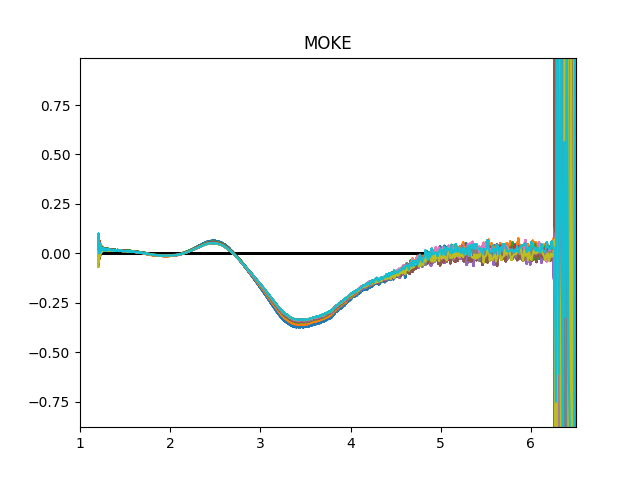

In [46]:
import os
from typing import List
from tkinter import filedialog
from tkinter import *
from tkinter.filedialog import askopenfilename
from numpy.lib.function_base import append
from numpy.lib.function_base import append
import pandas as pd
from scipy.optimize import curve_fit as cf
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
%matplotlib widget


def fce(x,b,bk,t):       #b[0]=b*abs(rs)^2, b[1]=k*b, b[2]=temny proud
    return b*np.power(np.sin(x),2)+bk*np.sin(2*x)+t          

def Fit(names,uhly,path,ref):
    resultados = []
    reflect = pd.read_csv(ref,index_col=0)
    for name in names:
        directory = [f for f in os.listdir(path) if name in f and 'fieldx_-' in f]
        directoryry = [f for f in os.listdir(path) if name in f and 'fieldx_-' not in f]
        for director, directoryr, i in zip(directory,directoryry,list(range(0,len(directory)))):
            if i == 0:
                datap = pd.read_csv(path + director, skiprows=12, index_col=0, sep='\t', header=None)
                datan = pd.read_csv(path + directoryr, skiprows=12, index_col=0, sep='\t', header=None)
            else:
                rawp = pd.read_csv(path + director, skiprows=12, index_col=0, sep='\t', header=None)
                rawn = pd.read_csv(path + directoryr, skiprows=12, index_col=0, sep='\t', header=None)
                datap = pd.concat([datap, rawp], axis=1)
                datan = pd.concat([datan, rawn], axis=1)
        rawp = datap
        rawn = datan
        kerr = []
        kerrn = []
        kerrp = []
        i=0
        for ind, row in rawp.iterrows():
            x = uhly
            y = np.array(row.values.astype(float))
            indd = round(1240/ind,4)
            if indd not in reflect.index:    # Ted je tu 1240/ind, protoze pocitame ve vlnovych delkach, ale rs a rp je v energiich prepocitej! 
                reflect.loc[indd] = None # Maze to ty hodnoty 
                reflect = reflect.interpolate(method = 'index')
            kerrinka,perrinka = cf(fce,np.deg2rad(x),y)

            # if 1240/ind > 2.9 and 1240/ind < 2.91:
            #   plt.plot(x,y,'.', label = path)
            #   plt.plot(np.arange(-16,16,0.1),fce(np.deg2rad(np.arange(-16,16,0.1)),kerrinka[0],kerrinka[1],kerrinka[2]))
            #   plt.xlim(-15,15)
            #   plt.figure()
            kerr.append(kerrinka[1]/kerrinka[0]*(reflect.loc[indd]['rsr']**2+reflect.loc[indd]['rsi']**2))
            kerrp.append(kerrinka[1]/kerrinka[0]*(reflect.loc[indd]['rsr']**2+reflect.loc[indd]['rsi']**2))
        for ind, row in rawn.iterrows():
            x = uhly
            y = np.array(row.values.astype(float))
            # if ind not in reflect.index:           # Tdy by nemelo byt treba interpolovat uz !!!
            #     reflect.loc[ind] = None 
            #     reflect = reflect.interpolate(method = 'index')
            indd = round(1240/ind,4)
            kerrinka,perrinka = cf(fce,np.deg2rad(x),y)
            kerr[i] = np.rad2deg((kerr[i]-kerrinka[1]/kerrinka[0]*(reflect.loc[indd]['rsr']**2+reflect.loc[indd]['rsi']**2))/2)
            kerrn.append(kerrinka[1]/kerrinka[0]*(reflect.loc[indd]['rsr']**2+reflect.loc[indd]['rsi']**2))
            i += 1

    #    plt.plot(1240/rawp.index,np.rad2deg(kerrn),label='neg')
    #    plt.plot(1240/rawp.index,np.rad2deg(kerrp),label='pos')
        # zapis = pd.DataFrame({'MOKE' : np.rad2deg(kerrn)},index = 1240/rawp.index)
        # zapis.to_csv(path + names[0][:-1] + '_kerrrot_pos.dat')
        # zapis = pd.DataFrame({'MOKE' : np.rad2deg(kerrp)},index = 1240/rawp.index)
        # zapis.to_csv(path + names[0][:-1] + '_kerrrot_neg.dat')
    #    plt.figure()
        plt.plot([1.2,7],[0,0],'k-', linewidth = 1)



        resultados.append([kerr,rawp.index.astype(float)])
        # dataa = pd.read_csv('Python\\Plotit\\LSMO_STO_Kerr_2021.dat', index_col = 0)
        # plt.plot(dataa['MOKE'], label = 'Measurment 2021')
        # d = pd.DataFrame({'MOKEE' : resultados[0][0]},index = 1240/resultados[0][1])
        # rozdil = pd.concat([dataa,d])
        # rozdil = rozdil.sort_index()
        # rozdil = rozdil.interpolate(method = 'index')
        # print(rozdil)
        # plt.plot(rozdil['MOKE'].subtract(rozdil['MOKEE']))
    off = 0
    for k in range(len(resultados)):
        plt.plot(1240/resultados[k][1],[i-off for i in resultados[k][0]], label = names[k])
        plt.title('MOKE')
        # plt.plot(1240/resultados[k][1],[i-j for i,j in zip(resultados[k][0],lol)], label = 'rozdil')
        zapis = pd.DataFrame({'MOKE' : [i-off for i in resultados[k][0]]},index = 1240/resultados[k][1])
        zapis.to_csv(path +'Fit/' + names[k][:-1] + '_smes_montana_'+ ref[-9:-4] +'.dat')



#########################################################################################################################################
#########################################################################################################################################
plt.plot([1.2,7],[0,0],'k-', linewidth = 1)



castispek = []
for i in range(1,11):
    castispek = castispek + ['time_' + str(i) + '_']


z = 5
p = 20
k = 2
uhl = [z - (z-k)/(p-1)*i for i in range (p)] + [-k - (z-k)/(p-1)*i for i in range (p)]
# uhl = [z - (z-k)/(p-1)*i for i in range (p)]

root = Tk()
root.withdraw()
root.call('wm', 'attributes', '.', '-topmost', True)
folder = filedialog.askdirectory(initialdir = "C:/Users/tmale/OneDrive/Documents/Data/LSMO/Francie 2021/Montana/Test_Montana_12_2022/Mirror/",title = "Select file") + '\\'
rsp = filedialog.askopenfilename(initialdir = "C:/Users/tmale/OneDrive/Documents/Data/Mirrors/Mirrors visnovsky reflectivity/Energy/",title = "Select file",filetypes = (("txt files","*.dat .txt .KNT"),("all files","*.*")),multiple=True)

for i in rsp:
    Fit(castispek,uhl,folder,i)








# plt.legend()
plt.ylim(-0.88,0.99)
plt.xlim(1,6.5)
plt.show()

## **Rozdeleni rotace a elipticity v Montane**

C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\1803740142.py:33: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  data = data[~data.isin([np.nan]).any(1)]    # drop nan values
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\1803740142.py:33: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  data = data[~data.isin([np.nan]).any(1)]    # drop nan values
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\1803740142.py:33: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  data = data[~data.isin([np.nan]).any(1)]    # drop nan values
C:\Users\tmale\AppData\Local\Temp\ipykernel_2088\1803740142.py:33: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  data = data[~data.isin([np.nan]).any(1)]    # drop nan values
C:\Users\tmale\AppData\L

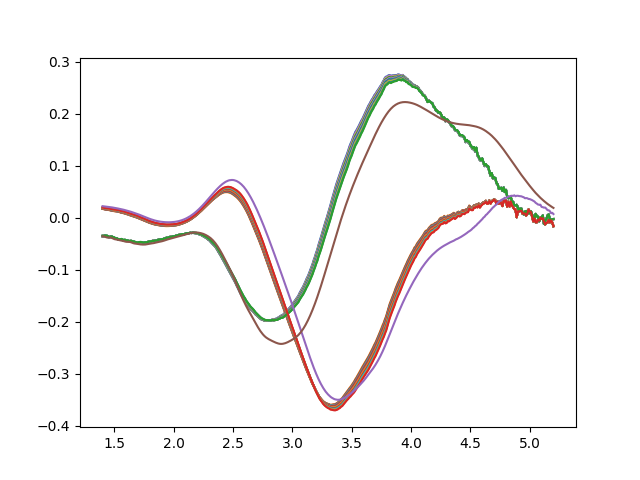

In [50]:
import os
from typing import List
from tkinter import filedialog
from tkinter import *
from tkinter.filedialog import askopenfilename
from numpy.lib.function_base import append
from numpy.lib.function_base import append
import pandas as pd
from scipy.optimize import curve_fit as cf
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
%matplotlib widget

root = Tk()
root.withdraw()
root.call('wm', 'attributes', '.', '-topmost', True)
NoDes = filedialog.askopenfilename(initialdir = "C:/Users/tmale/OneDrive/Documents/Data/LSMO/Francie 2021/Montana/Test_Montana_12_2022/Mirror/",title = "Bez desek",filetypes = (("txt files","*.dat .txt .KNT"),("all files","*.*")),multiple=False)
Des = filedialog.askopenfilename(initialdir = "C:/Users/tmale/OneDrive/Documents/Data/LSMO/Francie 2021/Montana/Test_Montana_12_2022/Mirror/",title = "Desky",filetypes = (("txt files","*.dat .txt .KNT"),("all files","*.*")),multiple=False)
rsp = filedialog.askopenfilename(initialdir = "C:/Users/tmale/OneDrive/Documents/Data/Mirrors/Mirrors visnovsky reflectivity/Energy/",title = "Reflektivita",filetypes = (("txt files","*.dat .txt .KNT"),("all files","*.*")),multiple=True)

ND = pd.read_csv(NoDes, index_col = 0)
D = pd.read_csv(Des, index_col = 0)
D = D.rename(columns={'MOKE':'desky'})
ND = ND.rename(columns={'MOKE':'bez'})

for ref in rsp:
    reflect = pd.read_csv(ref,index_col = 0)
    data = pd.concat([reflect,ND,D])
    data = data.sort_index()
    data = data.interpolate(method = 'index')
    data = data[~data.index.duplicated(keep='first')] # drop duplicate indexes
    data = data[~data.isin([np.nan]).any(1)]    # drop nan values
    frame = pd.DataFrame(index = np.arange(1.4,5.21,0.01))
    for colname, col in data.items():
        frame[colname] = np.interp(np.arange(1.4,5.21,0.01),data.index,col)

    frame['Elipticita'] = 0
    frame['Rotace'] = 0

    for ind, row in frame.iterrows():
        a = frame.loc[ind]['rsr']*frame.loc[ind]['rpr']+frame.loc[ind]['rsi']*frame.loc[ind]['rpi']
        b = frame.loc[ind]['rsr']*frame.loc[ind]['rpi']-frame.loc[ind]['rsi']*frame.loc[ind]['rpr']
        NN = frame.loc[ind]['bez']
        DD = frame.loc[ind]['desky']
        lmbda = 1240/ind
        K = np.power(lmbda,2)
        W = 1- 93.0665**2/K
        Q = 1/(np.power(W,2) * lmbda * np.sqrt(1+136.24/W))
        delta = (Q * 1.69508759865 * 100000 + 2.884488929) * np.pi/180
        frame.at[ind,'Elipticita'] = (DD/np.sin(delta)-NN/np.tan(delta)+b*NN)/(b**2/a+a)
        frame.at[ind,'Rotace'] = (NN+frame.loc[ind]['Elipticita']*b)/a  # - ?


    plt.plot(frame['Elipticita'], label = 'Ellipticita new')
    plt.plot(-frame['Rotace'], label = 'Rotace new')
    frame = frame.drop('bez',axis = 1)
    frame = frame.drop('desky',axis = 1)
    frame.to_csv('C:/Users/tmale/OneDrive/Documents/Data/LSMO/Francie 2021/Montana/Test_Montana_12_2022/Mirror/Try 10 a 11/'+ref[-9:-4]+'.dat')

control = pd.read_csv('C:\\Users\\tmale\\OneDrive\\Documents\\Data\\LSMO\\Francie 2021\\MOKE\\PLD3971\\PLD3971_MOKE_25_1_2021_finalni.dat', index_col=0)
plt.plot(control)


# plt.legend()
